In [2]:
import glob
import sklearn
import scipy.io as sio
from scipy.spatial.distance import squareform
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from mne_connectivity.viz import plot_connectivity_circle
from mne.viz import circular_layout

import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import re
from pylab import *
##############################################################
# Draw chord maps
import os
import sys

In [3]:
root_dir = '/Users/fiona/Junhao/Project/BNU_SHFE'
sys.path.append(root_dir + '/Final_Version/Code/io_')
sys.path.append('../')
import io_

# 1. Data Preparation

## 1.1 BNA Anatomical Symmetric Regions
- Frontal Lobe 
- Temporal Lobe
- Parietal Lobe
- Insular Lobe
- Limbic Lobe
- Occipital Lobe
- Subcortical Nuclei


In [77]:
# BNA region info
df_bna = pd.read_excel(root_dir + '/Final_Version/RAW/BNA/BNA_subregions.xlsx')

In [78]:
df_bna

,Lobe,Lobe_M,Gyrus,Gyrus_M,Left and Right Hemisphere,Label ID.L,Label ID.R,Unnamed: 7,Anatomical and modified Cyto-architectonic descriptions,"lh.MNI(X,Y,Z)","rh.MNI(X,Y,Z)"
0,Frontal Lobe,Frontal,"SFG, Superior Frontal Gyrus",SFG,SFG_L(R)_7_1,1,2,"A8m, medial area 8",NaN,"-5 ,15, 54","7, 16, 54"
1,NaN,Frontal,NaN,SFG,SFG_L(R)_7_2,3,4,"A8dl, dorsolateral area 8",NaN,"-18, 24, 53","22, 26, 51"
2,NaN,Frontal,NaN,SFG,SFG_L(R)_7_3,5,6,"A9l, lateral area 9",NaN,"-11, 49, 40","13, 48, 40"
3,NaN,Frontal,NaN,SFG,SFG_L(R)_7_4,7,8,"A6dl, dorsolateral area 6",NaN,"-18, -1, 65","20, 4, 64"
4,NaN,Frontal,NaN,SFG,SFG_L(R)_7_5,9,10,"A6m, medial area 6",NaN,"-6, -5, 58","7, -4, 60"
...,...,...,...,...,...,...,...,...,...,...,...
118,NaN,Subcortical,NaN,Tha,Tha_L(R)_8_4,237,238,"rTtha, rostral temporal thalamus",NaN,"-7, -14, 7","3, -13, 5"
119,NaN,Subcortical,NaN,Tha,Tha_L(R)_8_5,239,240,"PPtha, posterior parietal thalamus",NaN,"-16, -24, 6","15, -25, 6"
120,NaN,Subcortical,NaN,Tha,Tha_L(R)_8_6,241,242,"Otha, occipital thalamus",NaN,"-15, -28, 4","13, -27, 8"
121,NaN,Subcortical,NaN,Tha,Tha_L(R)_8_7,243,244,"cTtha, caudal temporal thalamus",NaN,"-12, -22, 13","10, -14, 14"


In [ ]:
BNA_Lobes = df_bna['Lobe_M']

## 1.2 Model weights convert to 123*123


In [43]:
df_mat = sio.loadmat(root_dir + '/Final_Version/RAW/model_stats/first-order/L0G0.mat.mat')
weights = df_mat['mean']
# remove the constance
weights = weights[0,1::]
sys_weights = squareform(weights, force='no', checks=True)

# 2. Plot Chord

In [130]:
def squareform_weights(weight_file):
    df_mat = sio.loadmat(weight_file)
    weights = df_mat['mean']
    # remove the constance
    weights = weights[0,1::]
    sys_weights = squareform(weights, force='no', checks=True)
    return sys_weights


In [132]:
def creat_label_names(BNA_file):
    df_bna = pd.read_excel(BNA_file)
    BNA_Lobes = df_bna['Lobe_M']
    Lobes_Gyrus = df_bna['Gyrus_M']
    label_names = []
    for i in np.arange(len(BNA_Lobes)):
        label_names.append(BNA_Lobes[i].strip() + '_' + Lobes_Gyrus[i] + '-' + str(i))
    
    # for circle split
    Lobe_start_index = df_bna['Lobe'].dropna().index.to_numpy()
    
    return label_names, Lobe_start_index
    

In [147]:
def plot_chord(cmat, label_names, Lobe_start_index, N_lines, lut_file, save_dir = None):
    
    node_order = label_names
    group_boundaries = Lobe_start_index
    node_angles = circular_layout(label_names, node_order, start_pos = 0, group_boundaries = group_boundaries, group_sep = 5)

    # plot
    lut = sio.loadmat(lut_file)
    lut_9 = lut['hsv_lut_9']
    colors = lut_9[0:9,:]
    colors[2, :] = np.array([0.863, 0.957, 0.008, 1])
    colors[0,:] = np.array([0.808,0.066,0.348,1])
    colors[8, :] = np.array([1, 0, 0, 1])

    node_colors= np.zeros((len(label_names),4))
    for i, ind_i in enumerate(Lobe_start_index):
        if ind_i < np.max(np.array(Lobe_start_index)):
            ind_i_1 = Lobe_start_index[i+1]
            node_colors[ind_i:ind_i_1,:] = lut_9[i,:]
        else:
            node_colors[ind_i_1:len(label_names),:] = lut_9[i,:]


    #N_lines = 50
    Colorbar_pos = (-0.5,0.5)
    saveFormat = 'eps'
    fig = plt.figure(num=None, figsize=(13, 13), facecolor='white')
    plot_connectivity_circle(cmat, label_names, n_lines=N_lines, fig=fig, node_colors = list(node_colors), node_angles= node_angles, colorbar=True, colorbar_pos=Colorbar_pos, colormap = 'RdYlBu_r', subplot=111, facecolor='white', textcolor='black',node_edgecolor='black',linewidth=1.0,node_linewidth=0.5)

    # save
    if save_dir is not None:
        saveFormat = 'eps'
        fig.savefig(save_dir, facecolor='white', dpi=1000, format=saveFormat)
        
    plt.close()


In [129]:
def main(weight_file, N_lines, save_dir = None):
    
    BNA_file = root_dir + '/Final_Version/RAW/BNA/BNA_subregions.xlsx'
    lut_file = root_dir + '/Final_Version/RAW/hsv_lut_9.mat'
    
    sys_weights = squareform_weights(weight_file)
    label_names, Lobe_start_index = creat_label_names(BNA_file)
    
    plot_chord(sys_weights, label_names, Lobe_start_index, N_lines, lut_file, save_dir)
     

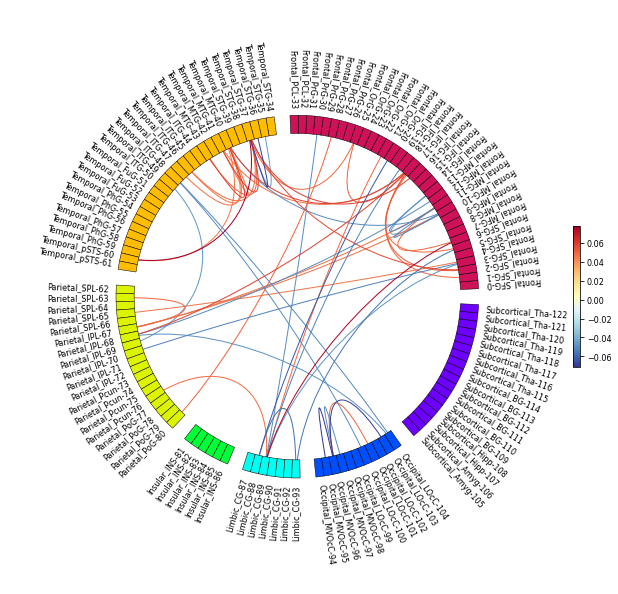

In [135]:
# run demo
weight_file = root_dir + '/Final_Version/RAW/model_stats/first-order/L0G0.mat.mat'
main(weight_file, N_lines = 50)

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L0G0_vs_L0G1_permut.eps


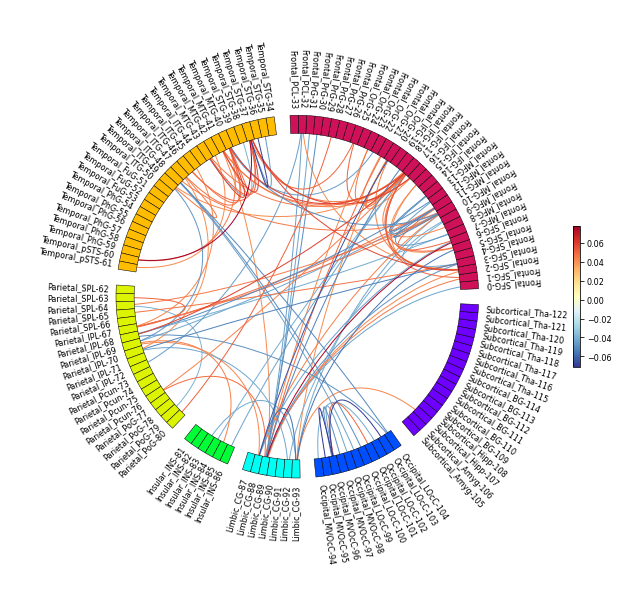

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L0G1_vs_L2G1_permut.eps


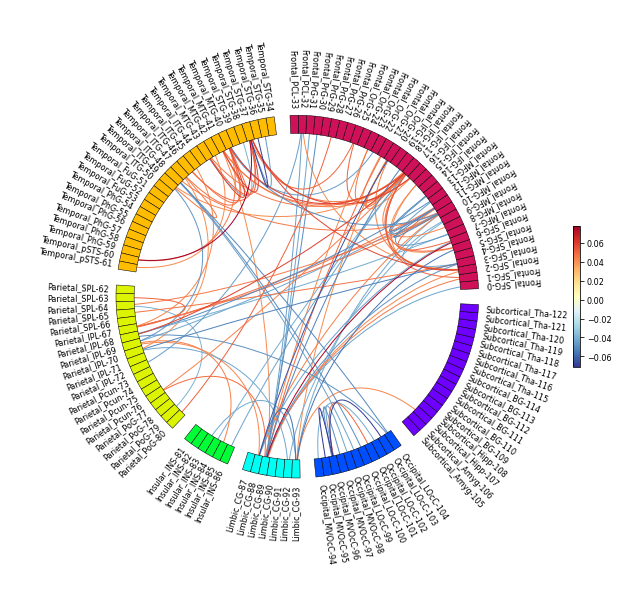

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L0G0_vs_L2G0_permut.eps


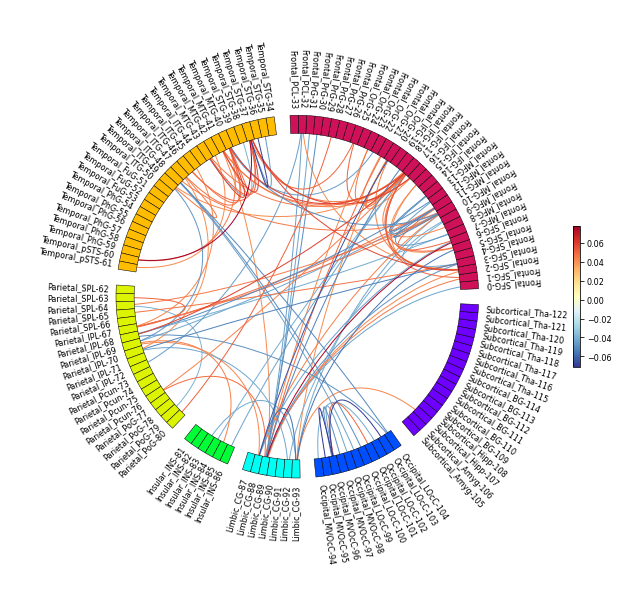

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L0G0_vs_L0G1.eps


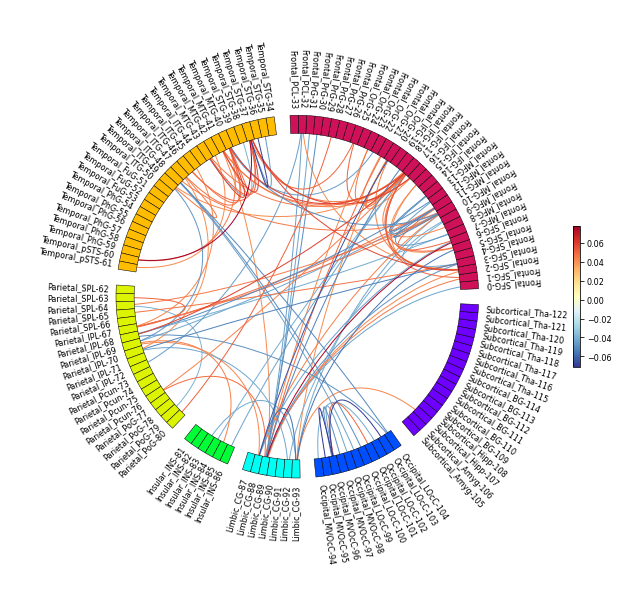

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L2G0_vs_L2G1_permut.eps


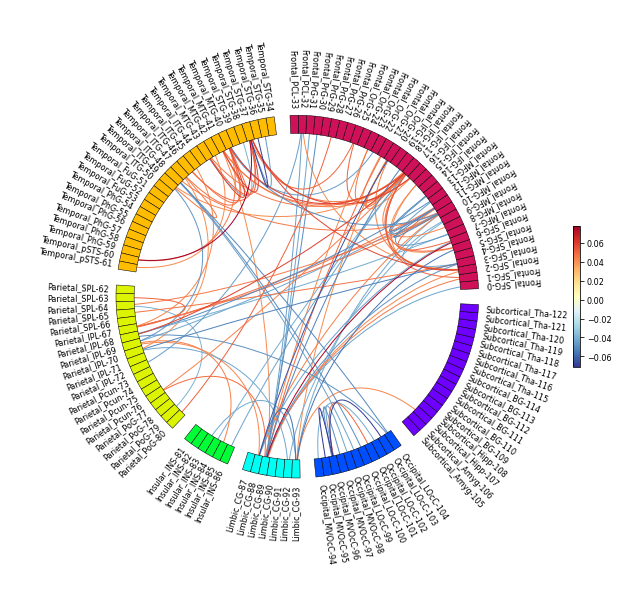

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L0G0_vs_L2G0.eps


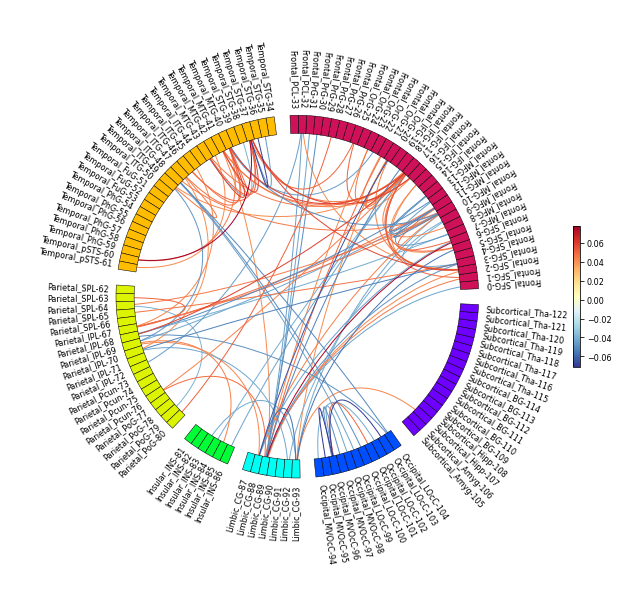

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L2G0_vs_L2G1.eps


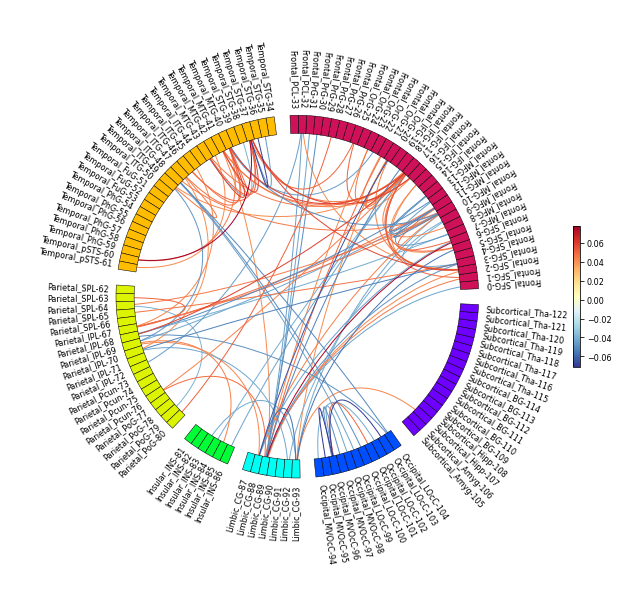

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L5G0_vs_L5G1_permut.eps


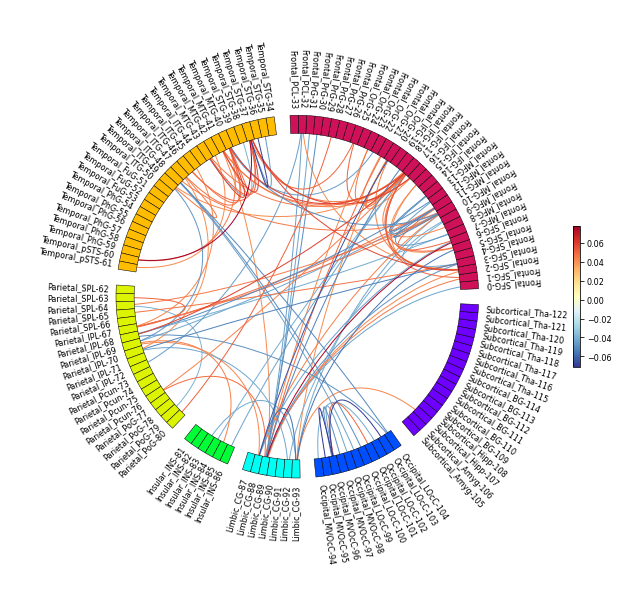

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L0G1_vs_L2G1.eps


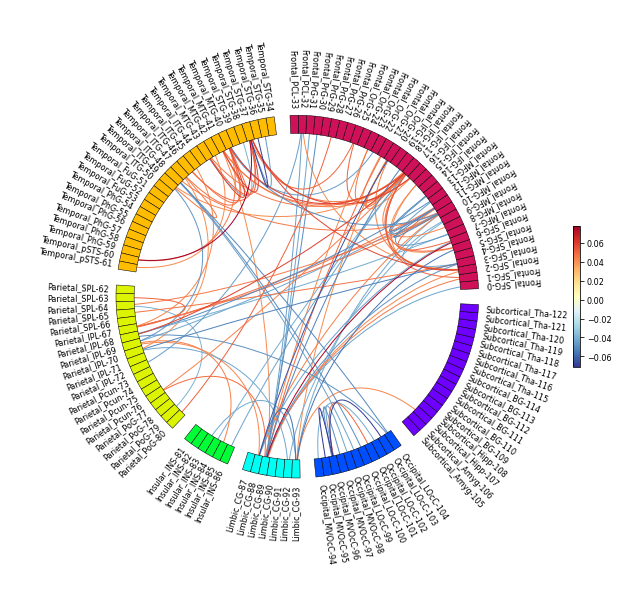

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_100/L5G0_vs_L5G1.eps


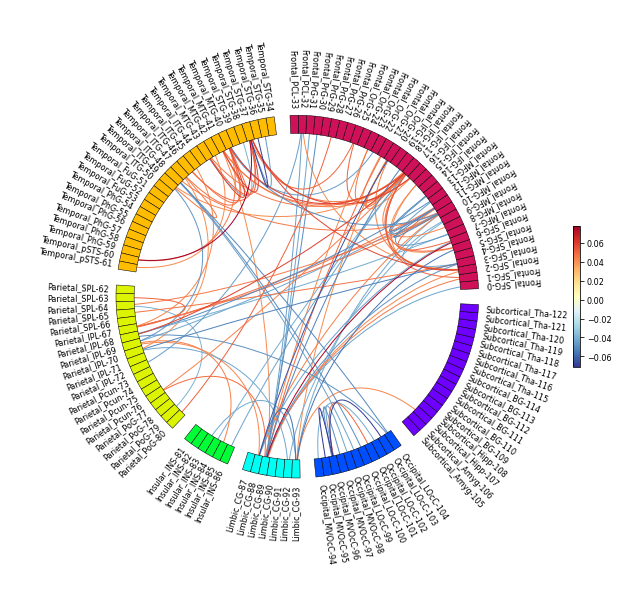

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L0G0_vs_L0G1_permut.eps


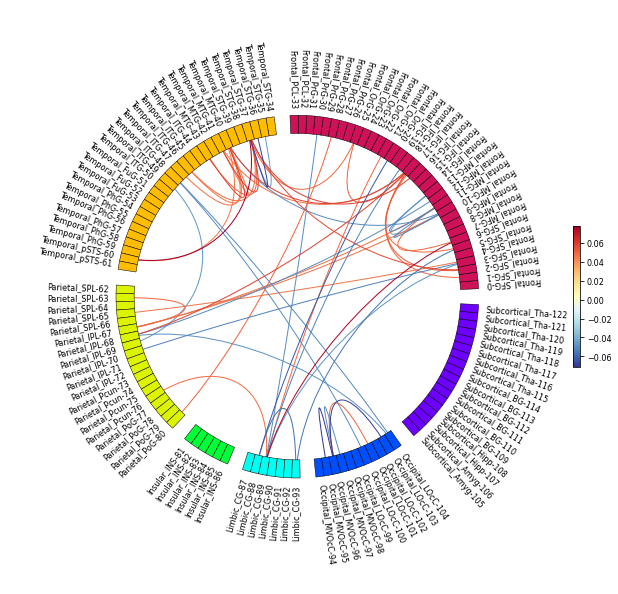

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L0G1_vs_L2G1_permut.eps


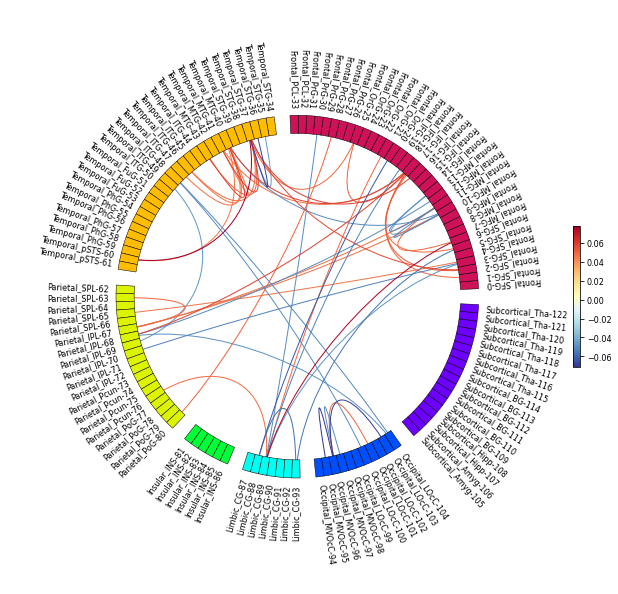

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L0G0_vs_L2G0_permut.eps


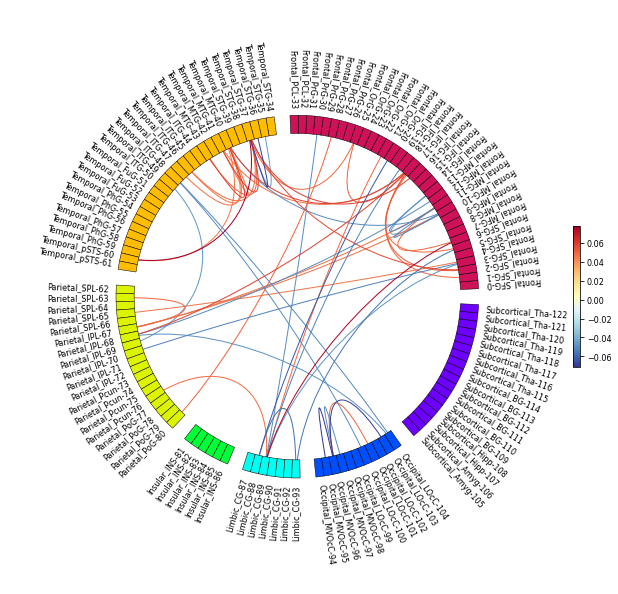

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L0G0_vs_L0G1.eps


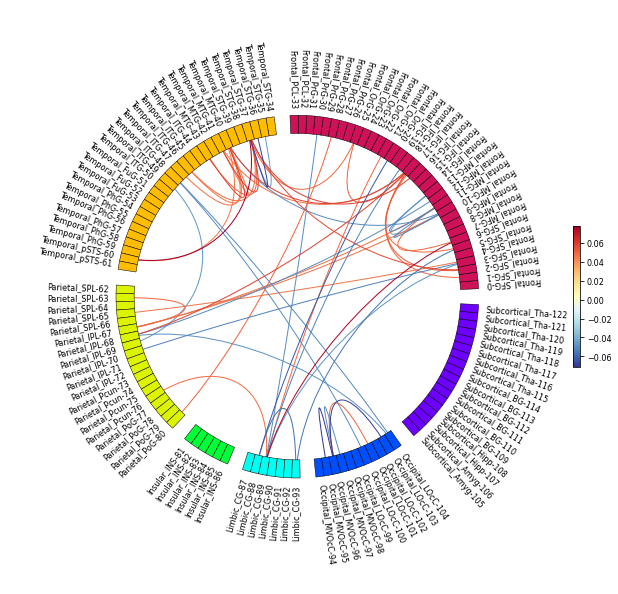

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L2G0_vs_L2G1_permut.eps


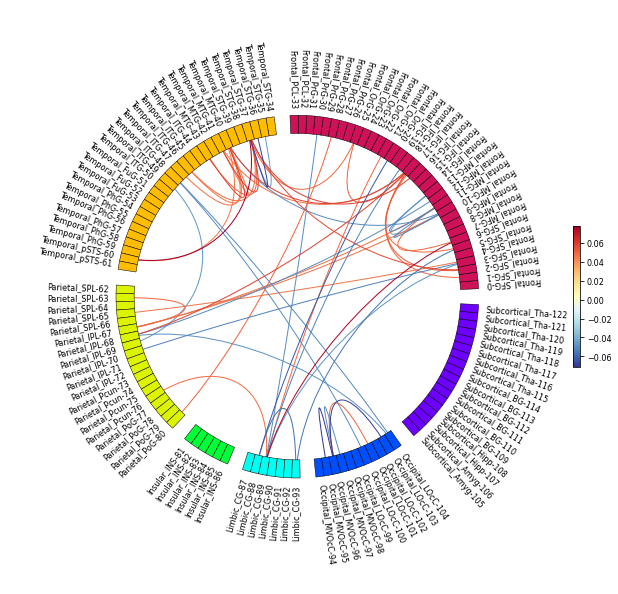

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L0G0_vs_L2G0.eps


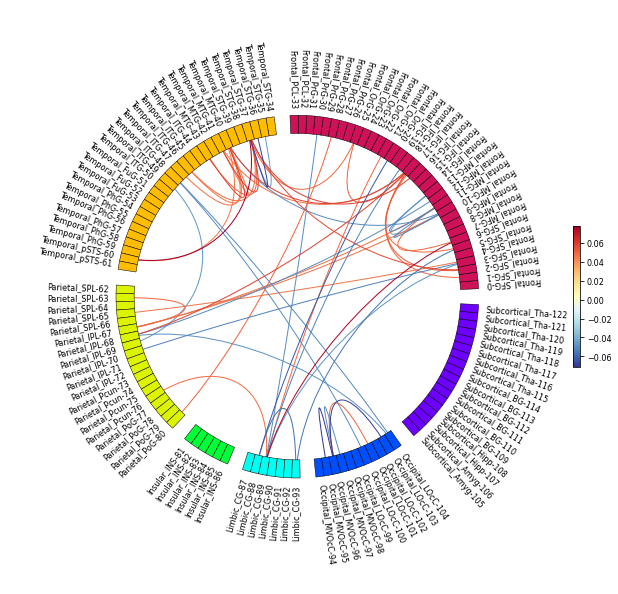

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L2G0_vs_L2G1.eps


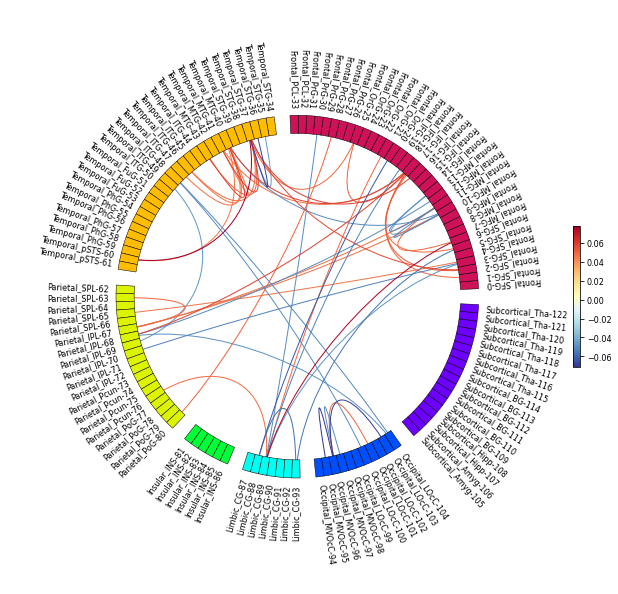

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L5G0_vs_L5G1_permut.eps


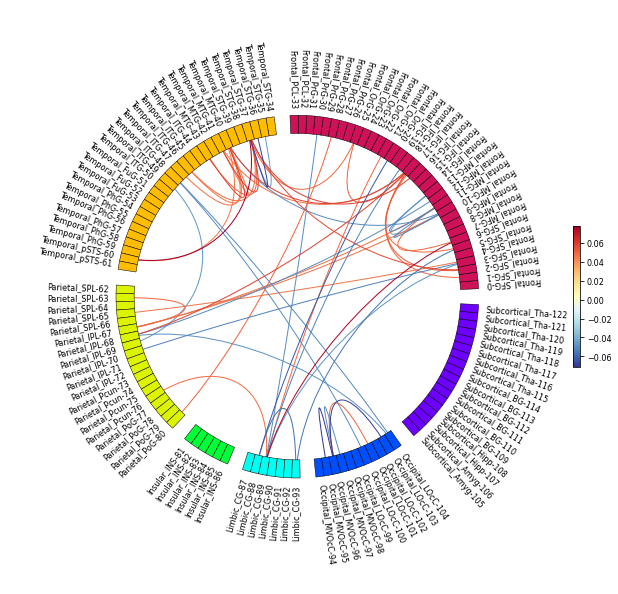

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L0G1_vs_L2G1.eps


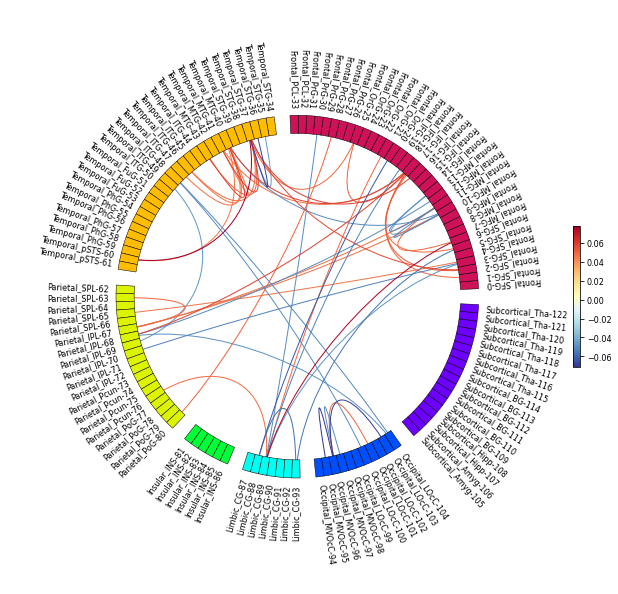

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_50/L5G0_vs_L5G1.eps


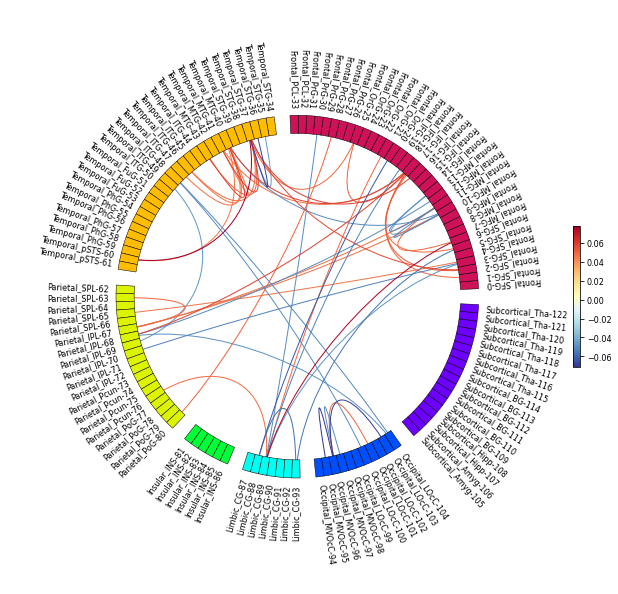

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L0G0_vs_L0G1_permut.eps


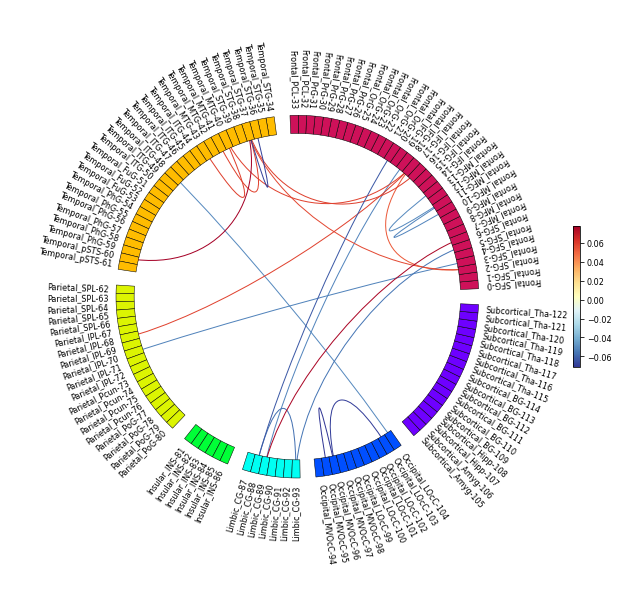

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L0G1_vs_L2G1_permut.eps


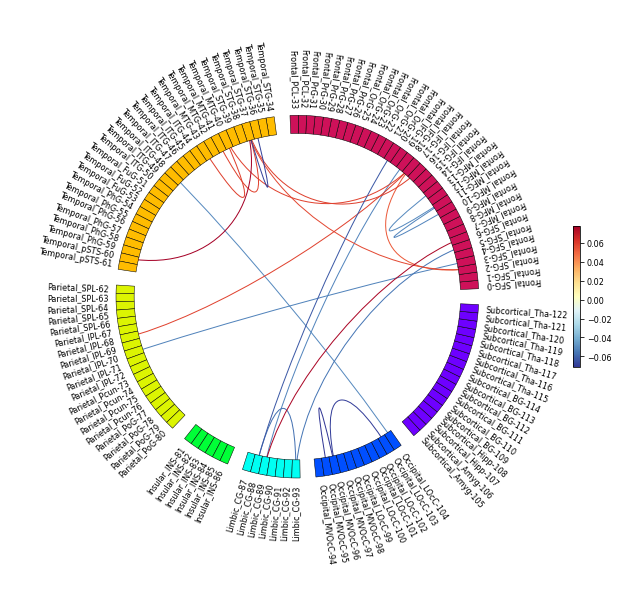

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L0G0_vs_L2G0_permut.eps


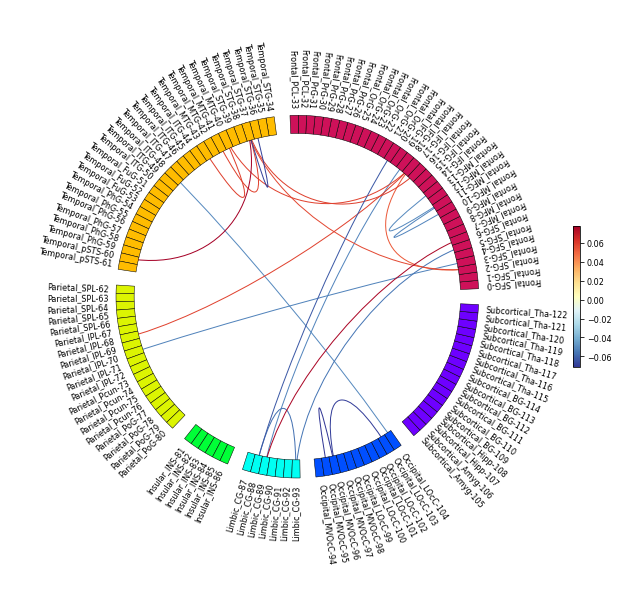

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L0G0_vs_L0G1.eps


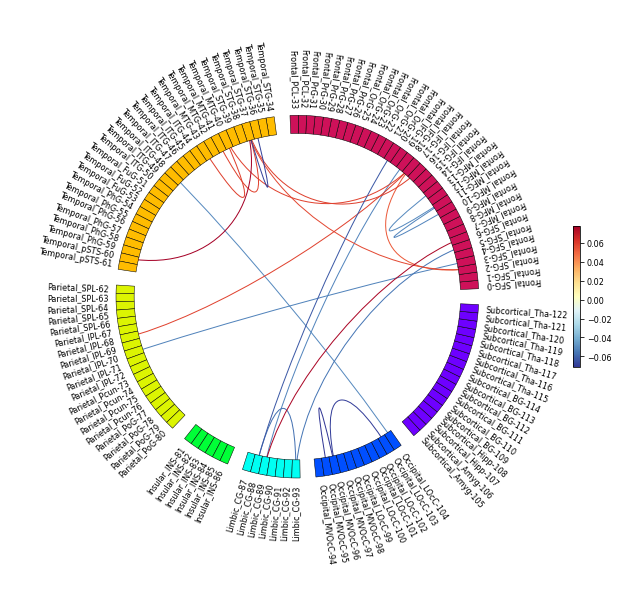

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L2G0_vs_L2G1_permut.eps


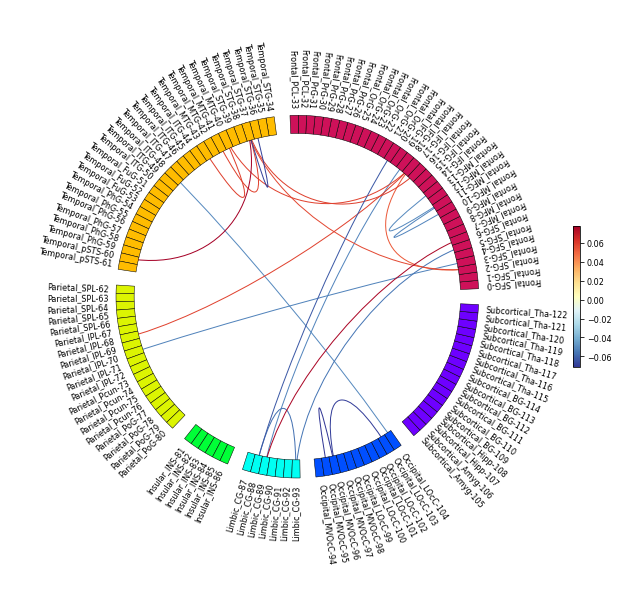

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L0G0_vs_L2G0.eps


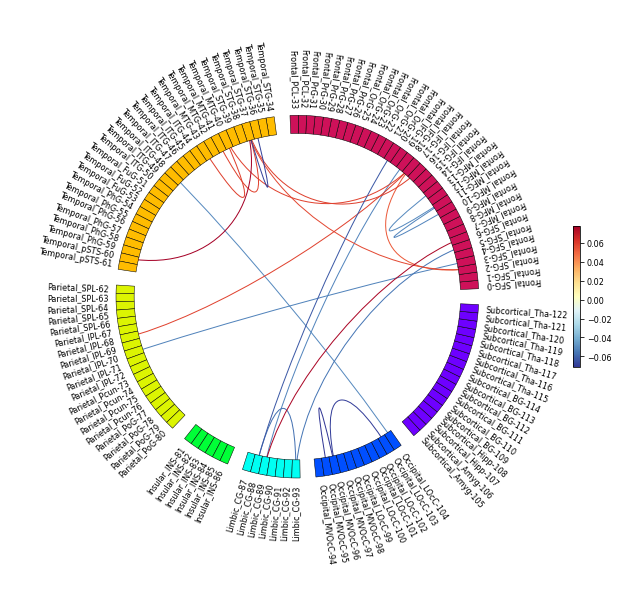

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L2G0_vs_L2G1.eps


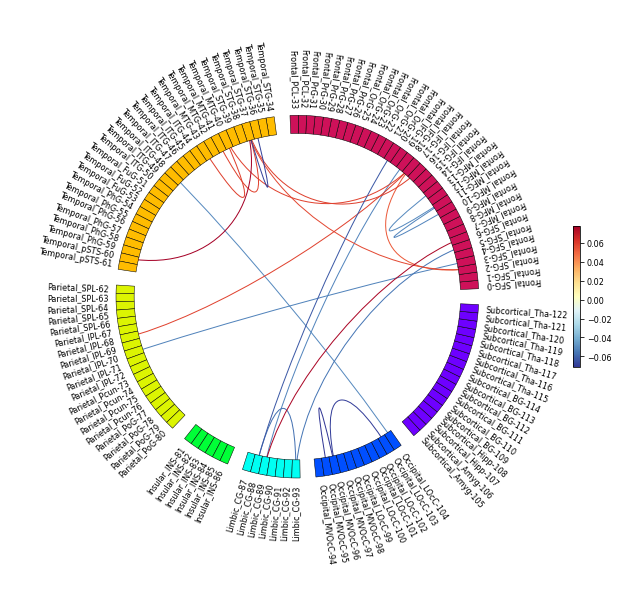

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L5G0_vs_L5G1_permut.eps


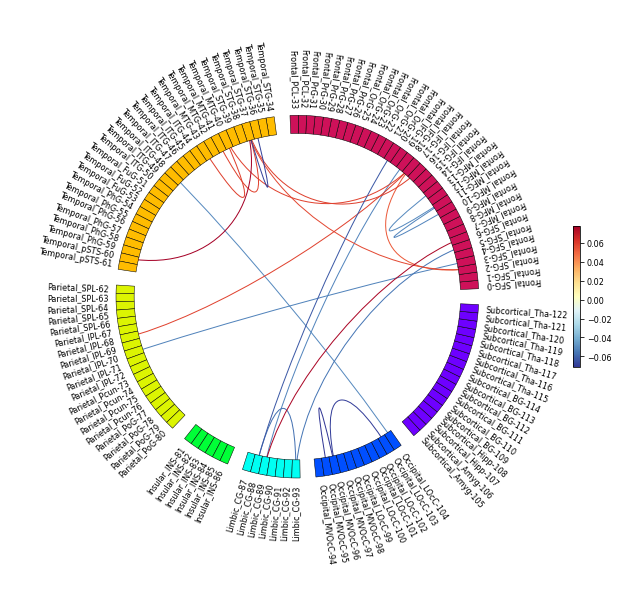

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L0G1_vs_L2G1.eps


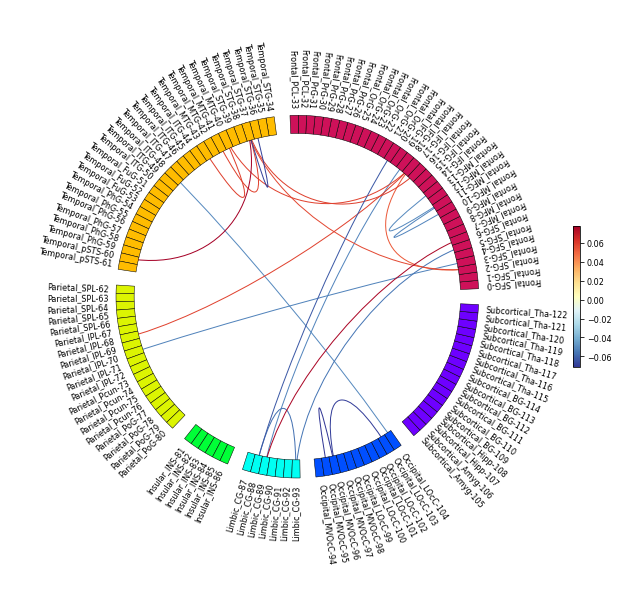

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_20/L5G0_vs_L5G1.eps


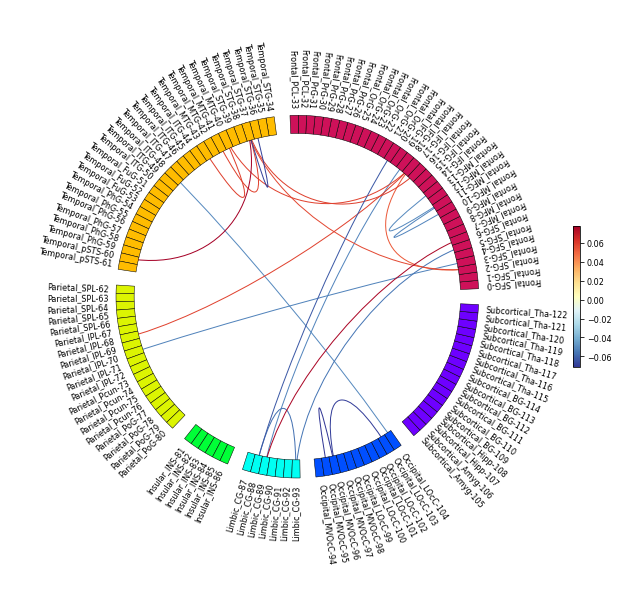

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L0G0_vs_L0G1_permut.eps


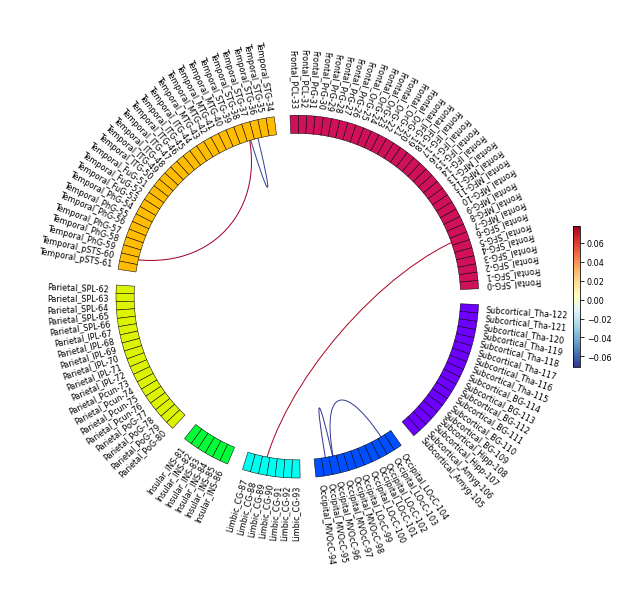

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L0G1_vs_L2G1_permut.eps


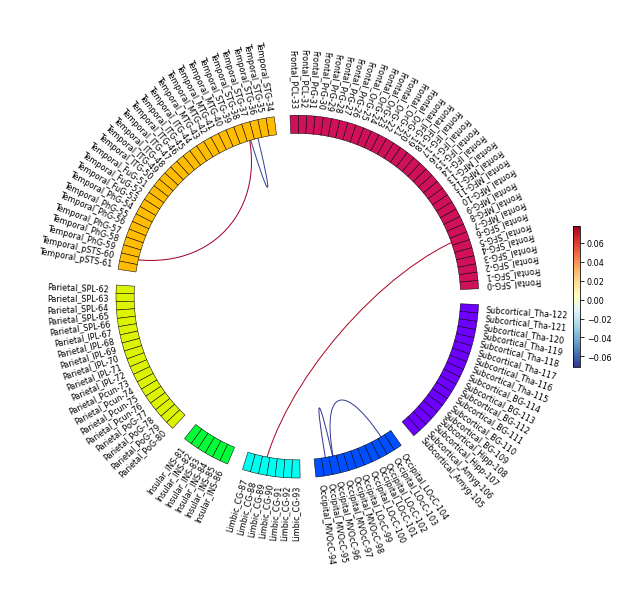

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L0G0_vs_L2G0_permut.eps


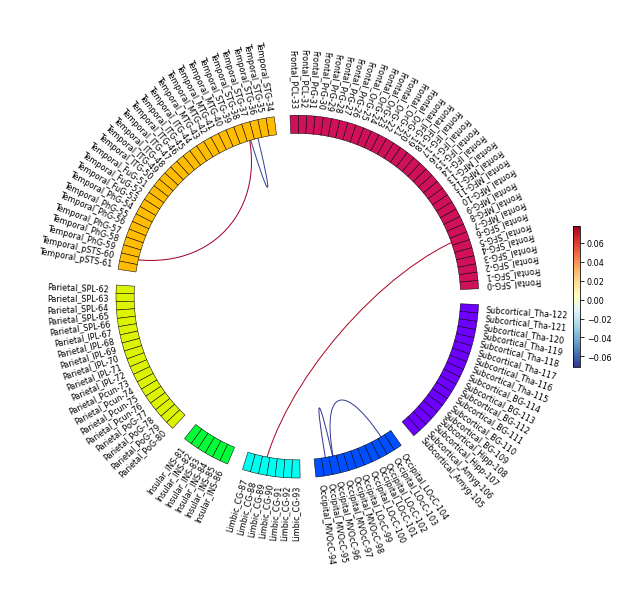

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L0G0_vs_L0G1.eps


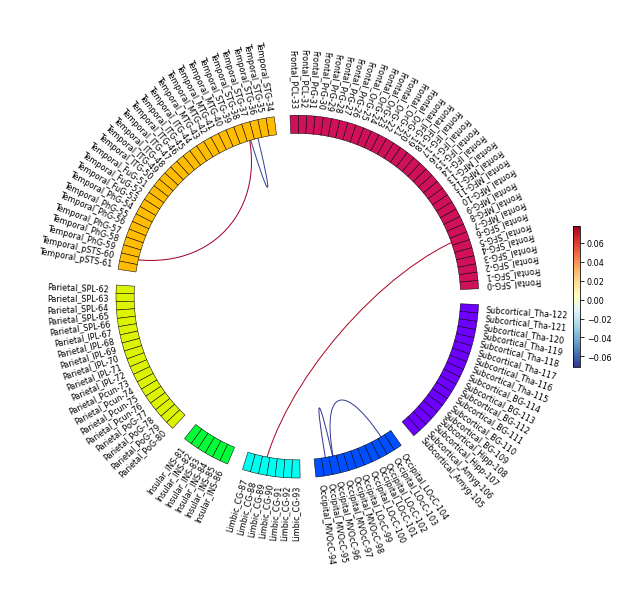

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L2G0_vs_L2G1_permut.eps


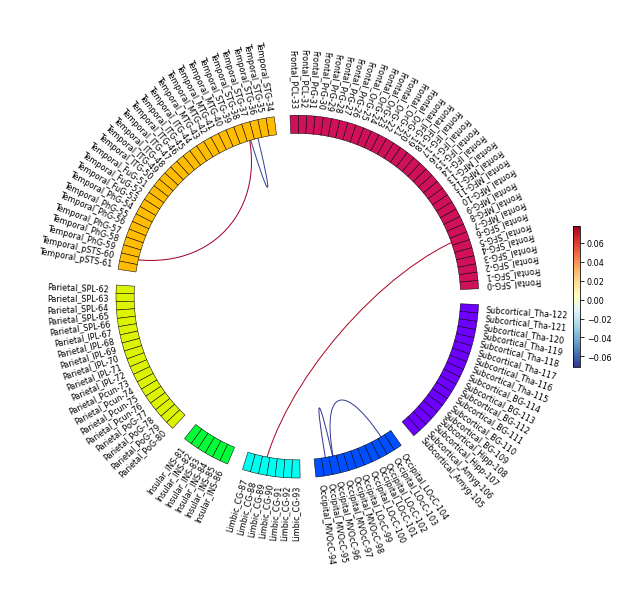

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L0G0_vs_L2G0.eps


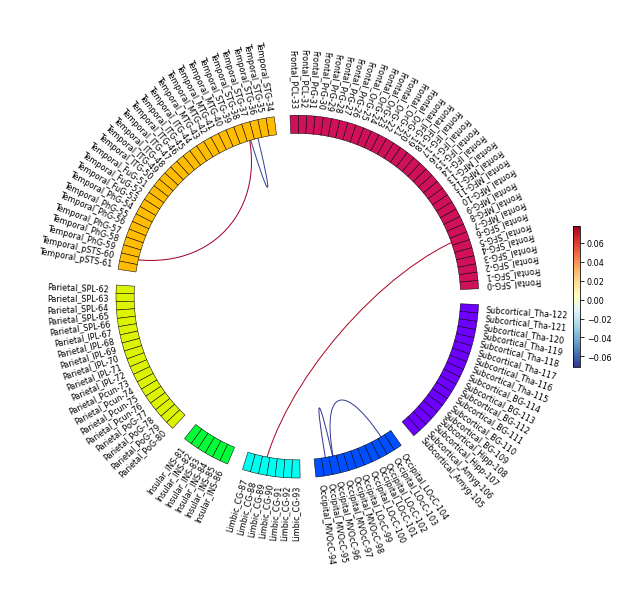

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L2G0_vs_L2G1.eps


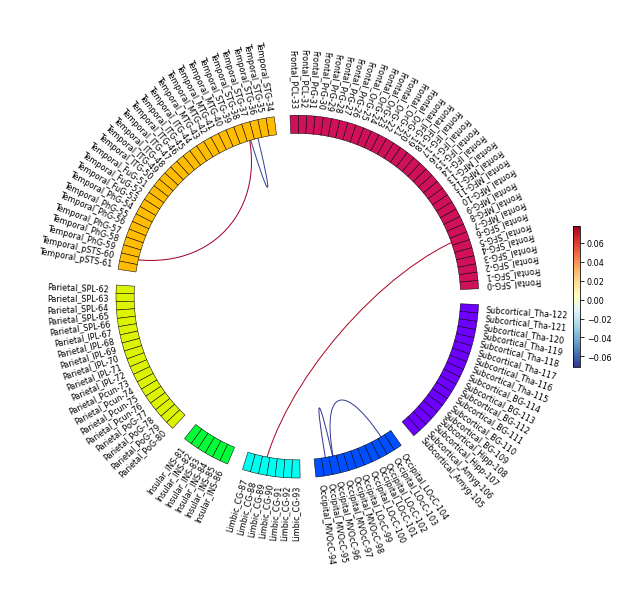

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L5G0_vs_L5G1_permut.eps


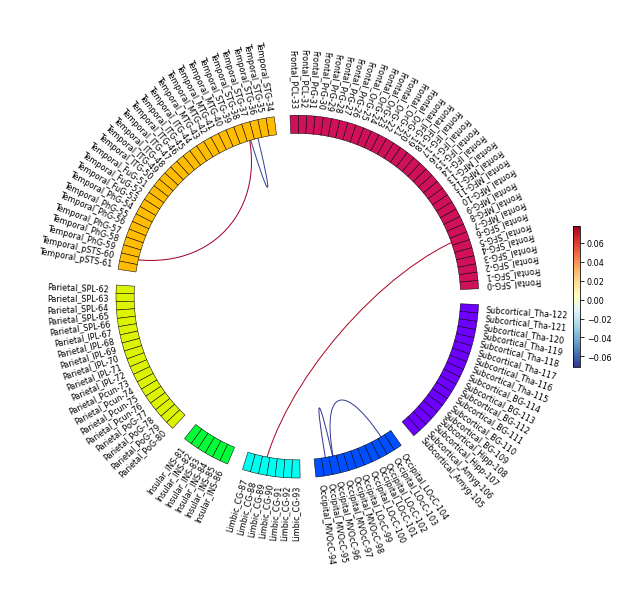

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L0G1_vs_L2G1.eps


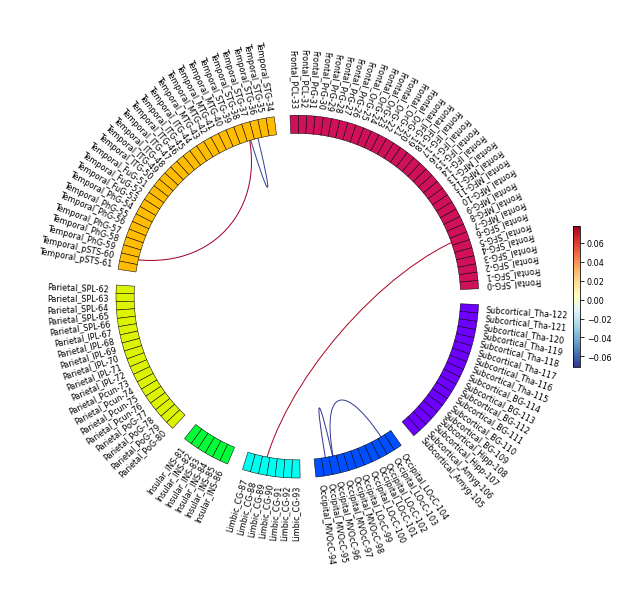

/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/second-order/Top_5/L5G0_vs_L5G1.eps


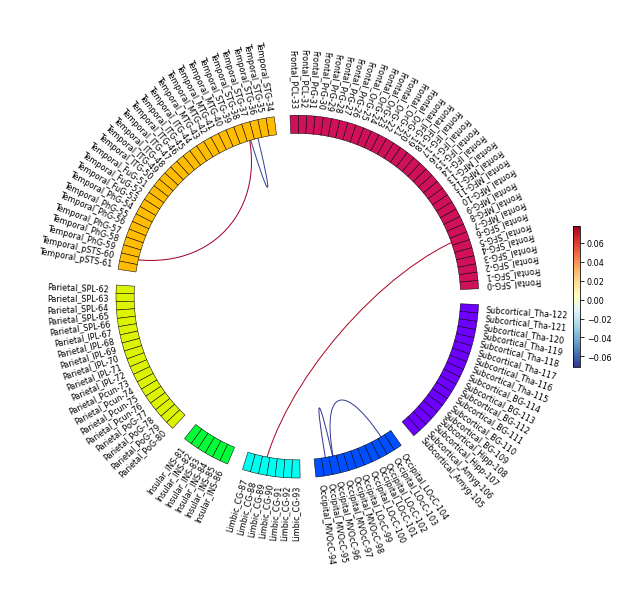

In [155]:
# run for all the model weights
# first order
order_type = 'second-order'
files = glob.glob(root_dir + '/Final_Version/RAW/model_stats/' + order_type +  '/*.mat')

Ns_lines = [100, 50, 20, 5]

for N_lines in Ns_lines:

    for file in files:
        f_path, f_name, _ = io_.file_split(file)

        save_path = root_dir + '/Final_Version/Result/' + order_type + '/Top_' + str(N_lines)

        if not os.path.exists(save_path):
            os.makedirs(save_path)

        # save_fig
        save_fig = save_path + '/' + f_name
        if '.mat' in save_fig:
            save_fig = save_fig.replace('.mat', '.eps')
        else:
            save_fig = save_path + '/' + f_name + '.eps'

        print(save_fig)

        main(weight_file, N_lines, save_fig)



In [137]:
files

['/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L2G0.mat.mat',
 '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L2G1.mat.mat',
 '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L5G1.mat.mat',
 '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L5G0.mat.mat',
 '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L0G0.mat.mat',
 '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L0G1.mat.mat']

## 2.1 Overlap of the first and second order weight map
- First-order for left/right classification
- Second-order for male/female classification
- Overlap between first- and second-order coefficients:
  - Sort first-order coefficients by absolute values
  - Sort second-order coefficients by absolute values
  - Take overlap
  - Show first-order coefficients values
- Justification for second-order classification: select gender-related (statistically) coefficients from first-order coefficients



In [159]:
# lambda=5, view the weight map

# male
file_0 = '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L5G0.mat.mat'
# female
file_1 = '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L5G1.mat.mat'

## male and female difference based model weights
file_2 = '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/second-order/L5G0_vs_L5G1.mat'

coef_0 = sio.loadmat(file_0)['mean'][0,1::]
coef_1 = sio.loadmat(file_1)['mean'][0,1::]
coef_2 = sio.loadmat(file_2)['mean'][0,1::]


In [171]:
# select the top-k abs weights
def topN_ind(arr, topN):
    return(arr.argsort()[-topN:][::-1])
    

In [204]:
# top 0.02
rate = 0.02
topN = int(np.around(7503*rate)) # top-150
ind_0 = topN_ind(np.abs(coef_0), topN)
ind_1 = topN_ind(np.abs(coef_1), topN)
ind_2 = topN_ind(np.abs(coef_2), topN)

# overlap
ind_02 = np.intersect1d(ind_0, ind_2) # male
ind_12 = np.intersect1d(ind_1, ind_2) # female


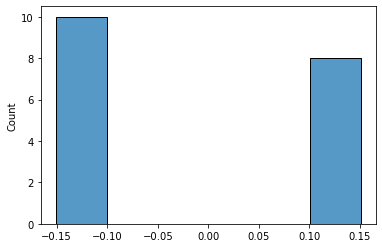

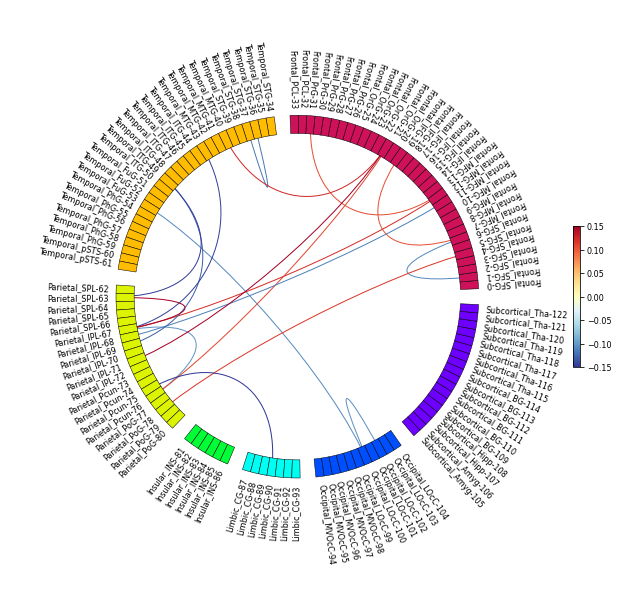

In [237]:

sns.histplot(coef_0[ind_02])
ind_02.shape

# male specific 
coef_male = np.zeros((7503,))
coef_male[ind_02] = coef_0[ind_02]

#weight_file = root_dir + '/Final_Version/RAW/model_stats/first-order/L0G0.mat.mat'
lut_file = root_dir + '/Final_Version/RAW/hsv_lut_9.mat'
cmat_male = squareform(coef_male, force='no', checks=True)
save_dir = root_dir + '/Final_Version/Result/Gender_Specific/Male_top_' + str(ind_02.shape[0]) + '.eps'

plot_chord(cmat_male, label_names, Lobe_start_index, ind_02.shape[0], lut_file, save_dir)
    

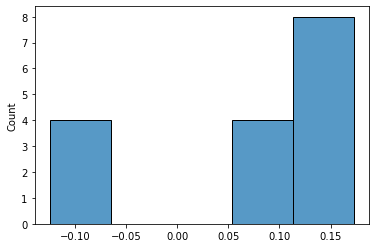

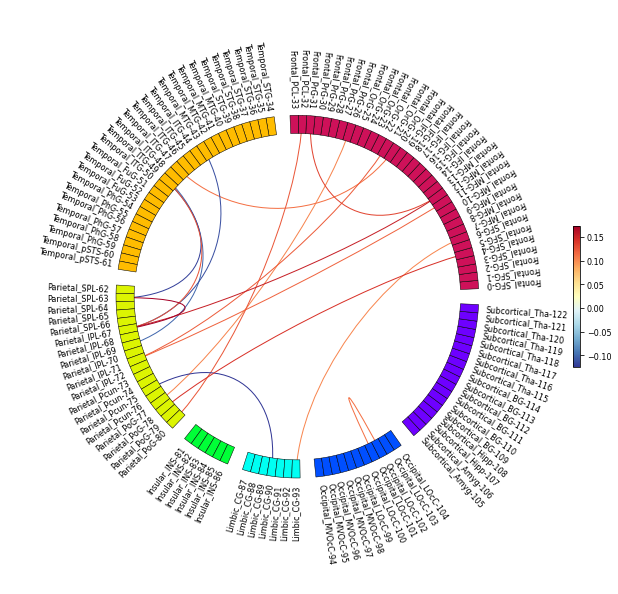

In [238]:
# female
sns.histplot(coef_1[ind_12])
ind_12.shape

# male specific 
coef_female = np.zeros((7503,))
coef_female[ind_12] = coef_1[ind_12]

#weight_file = root_dir + '/Final_Version/RAW/model_stats/first-order/L0G0.mat.mat'
lut_file = root_dir + '/Final_Version/RAW/hsv_lut_9.mat'
cmat_female = squareform(coef_female, force='no', checks=True)
save_dir = root_dir + '/Final_Version/Result/Gender_Specific/Female_top_' + str(ind_12.shape[0]) + '.eps'

plot_chord(cmat_female, label_names, Lobe_start_index, ind_12.shape[0], lut_file, save_dir)
  

In [232]:
cmat_male

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [234]:
save_dir

'/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/Result/Gender_Specific/Male_top_18.eps'

(16,)

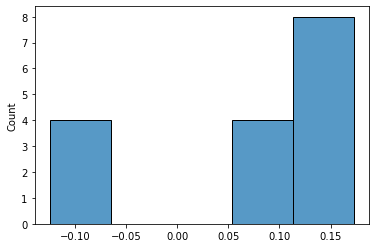

In [206]:
sns.histplot(coef_1[ind_12])
ind_12.shape

# female specific



array([ 260, 4127, 2270, 2250,  261, 7158, 4823, 3352, 6482, 4521,  799,
       3408, 5964, 2605,  778, 1777, 2371, 2304, 2401, 6389, 6943, 5736,
        731, 3870, 4815, 2373, 4366,  280, 2764,    5, 6526, 2912, 1231,
       6087, 5794, 1835,  843, 4654, 1127, 6912, 6944, 5907, 1852,   42,
       6406,  135, 5310,  733, 4821, 1940,  289, 4746, 3353, 2254,  619,
        777, 4130, 1855, 4388, 2297, 4105, 6569, 2370, 4106, 3556, 1452,
        554, 1120, 3134, 6329,  728, 6021, 2289,  448,    6, 6397, 2994,
        426, 6611,   22, 3762, 6025,  555, 4122, 5769, 2150, 2377, 3263,
       1343, 6806, 6330, 2317, 2423, 2773, 5963, 1342, 4100, 3538,  421,
       2263])

In [182]:
np.intersect1d(np.array([1,2,3]), np.array([1,2,6,0]))

array([1, 2])

In [185]:
ind_02.shape

(5,)

In [202]:
np.round(7503*0.02)

150.0

In [196]:
200/7503

0.026656004264960682

In [198]:
7503*0.02

150.06

<AxesSubplot:ylabel='Count'>

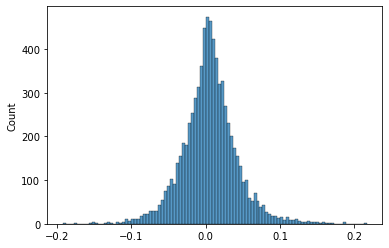

In [241]:
sns.histplot(coef_0)

<AxesSubplot:ylabel='Count'>

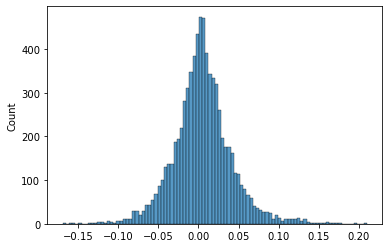

In [242]:
sns.histplot(coef_1)

<AxesSubplot:ylabel='Count'>

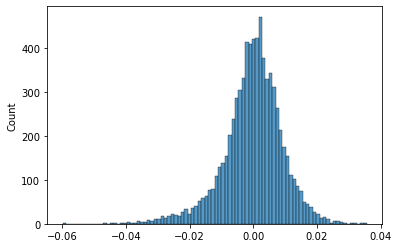

In [243]:
sns.histplot(coef_0 - coef_1)

In [244]:
np.mean(coef_0 - coef_1)

-0.00014136851843678873

In [246]:
np.corrcoef(coef_0, coef_1)

array([[1.        , 0.96799669],
       [0.96799669, 1.        ]])

## 2.2 First order: female - male

In [248]:
coef_det = coef_1 - coef_0

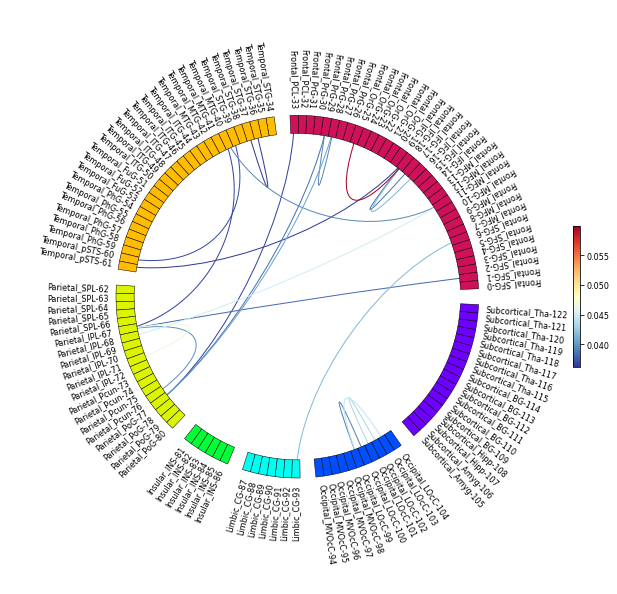

In [249]:

#weight_file = root_dir + '/Final_Version/RAW/model_stats/first-order/L0G0.mat.mat'
lut_file = root_dir + '/Final_Version/RAW/hsv_lut_9.mat'
cmat_det= squareform(coef_det, force='no', checks=True)
save_dir = root_dir + '/Final_Version/Result/Gender_Specific/Female_Male_det_top_20.eps'

plot_chord(cmat_det, label_names, Lobe_start_index, 20, lut_file, save_dir)
  

# 3. Gender specific rate
Spec = 1 - Dice

In [4]:
# for 100206 Dice
#subj = 100206

def tri_area(x1,x2,y1,y2):
        area = 1/2*(y1+y2)*(abs(x1-x2))
        return area

def AUC(Dices):
    AUC = 0

    for k in np.arange(len(Dices)-1):
        #print(k)
        x1 = Dices.iloc[k]['thr']
        y1 = Dices.iloc[k]['Dice']
        x2 = Dices.iloc[k+1]['thr']
        y2 = Dices.iloc[k+1]['Dice']
        area = tri_area(x1,x2,y1,y2)
        AUC = AUC + area

    return AUC

def AUC_spec(Dices):
    AUC = 0

    for k in np.arange(len(Dices)-1):
        #print(k)
        x1 = Dices.iloc[k]['thr']
        y1 = Dices.iloc[k]['Spec_Rate']
        x2 = Dices.iloc[k+1]['thr']
        y2 = Dices.iloc[k+1]['Spec_Rate']
        area = tri_area(x1,x2,y1,y2)
        AUC = AUC + area

    return AUC

def subj_dice_auc(t_act, t_pred, thrs):
#     t_act = df[df['subject']==subj]['task_t'].to_numpy()[0]
#     t_pred = df[df['subject']==subj]['predict_task_t'].to_numpy()[0]

    # thr = 0.05
    #thr = 0.5

    #thrs = np.arange(0.0001,1,0.0001) # 
    Dices = pd.DataFrame()
    for k, thr in enumerate(thrs):

        topN = round(thr*len(t_act))

        # 升序排列，返回索引index,取排名靠前的topN
        N_act = np.argsort(t_act)[-topN:]
        N_pred = np.argsort(t_pred)[-topN:]

        # Dcie
        Dice = 2 * len(set(N_act).intersection(set(N_pred)))/(len(N_act) + len(N_pred))
        Dices.loc[k, 'thr'] = thr
        Dices.loc[k, 'Dice'] = Dice

    # 显示Dice系数与阈值的折线图
#     plt.plot(Dices['thr'], Dices['Dice'])
#     plt.scatter(Dices['thr'], Dices['Dice'])

    # 计算曲线的AUC

    DiceAUC = AUC(Dices)
    #print('DiceAUC =',DiceAUC)
    return DiceAUC, Dices


### A Demo for spec_rate

<AxesSubplot:xlabel='thr', ylabel='Spec_Rate'>

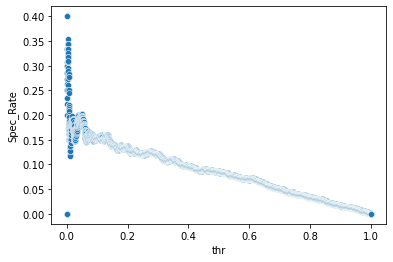

In [7]:
## Weights
# male
file_0 = '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L5G0.mat.mat'
# female
file_1 = '/Users/fiona/Junhao/Project/BNU_SHFE/Final_Version/RAW/model_stats/first-order/L5G1.mat.mat'

coef_0 = sio.loadmat(file_0)['mean'][0,1::] # remove the constant
coef_1 = sio.loadmat(file_1)['mean'][0,1::] # remove the constant

## Dice
thrs = np.arange(0.0001,1, 0.01)
DiceAuc, Dices = subj_dice_auc(coef_0, coef_1, thrs)

## add spec_rate
Dices['Spec_Rate'] = 1 - Dices['Dice']
AUC_Spec = AUC_spec(Dices)

# plot

sns.scatterplot(x = 'thr', y = 'Spec_Rate', data = Dices)



In [6]:
import torch 

def get_coef(file_name, file_dir):
    file_path = os.path.join(file_dir, file_name)
    model = torch.load(file_path)
    return model.theta


In [17]:
base_dir = "/media/shuo/MyDrive/data/HCP/BNA/Models"

lambda_ = 5.0

model_path = os.path.join(base_dir, "lambda{}".format(int(lambda_)))

splits = [0, 1, 2, 3, 4]
session = ["REST1", "REST2"]

aucs = []

seed_init = 2022
iterations = 50
for i in range(iterations):
    for half_m in [0, 1]:
        for split_m in splits:
            for session_m in session:
                model_file_m = 'lambda_%s_%s_%s_%s_gender_0_%s.pt' % (lambda_, session_m, split_m, half_m, seed_init - i)
                coef_m = get_coef(model_file_m, model_path).reshape((1, -1))[0, 1:]
                
                for j in range(iterations):
                    for half_f in [0, 1]:
                        for split_f in splits:
                            for session_f in session:
                                model_file_f = 'lambda_%s_%s_%s_%s_gender_0_%s.pt' % (lambda_, session_f, split_f, half_f, seed_init - j)
                                coef_f = get_coef(model_file_f, model_path).reshape((1, -1))[0, 1:]
                                thrs = np.arange(0.0001,1,0.01)
                                DiceAuc, Dices = subj_dice_auc(coef_m, coef_f, thrs)

                                ## add spec_rate
                                Dices['Spec_Rate'] = 1 - Dices['Dice']
                                AUC_Spec = AUC_spec(Dices)
                                aucs.append(AUC_Spec)

In [16]:
coef_m

array([], shape=(0, 7504), dtype=float64)